# Animated Spinor Evolution

This notebook demonstrates how spinors evolve under continuous rotation, reproducing the behavior from the original MATLAB `animate_spinor.m` script.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML, display
import ipywidgets as widgets

# Import spinor visualization
import sys
sys.path.insert(0, '..')
from spinor_viz import Spinor, plot_spinor_3d, plot_spinor_2d
from spinor_viz.core import normalize
from spinor_viz.visualization import create_interactive_3d

%matplotlib inline
plt.rcParams['figure.figsize'] = [10, 8]
plt.rcParams['animation.html'] = 'jshtml'


## Basic Animation: Spinor Rotating Around Z-axis

Let's recreate the MATLAB animation showing a spinor rotating continuously around an axis.

In [2]:
def animate_spinor_rotation(
    initial_spinor,
    rotation_axis,
    max_angle=4*np.pi,
    n_frames=100,
    view_angles=(20, 45),
    interval=50
):
    """
    Create an animation of a spinor rotating around an axis.

    Parameters
    ----------
    initial_spinor : Spinor
        The starting spinor state.
    rotation_axis : np.ndarray
        Unit vector for the rotation axis.
    max_angle : float
        Maximum rotation angle (4π for full spinor cycle).
    n_frames : int
        Number of animation frames.
    view_angles : tuple
        (elevation, azimuth) for 3D view.
    interval : int
        Milliseconds between frames.

    Returns
    -------
    animation.FuncAnimation
        The matplotlib animation object.
    """
    rotation_axis = normalize(rotation_axis)
    angles = np.linspace(0, max_angle, n_frames)

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    def init():
        return []

    def update(frame):
        ax.clear()

        # Rotate spinor
        angle = angles[frame]
        s = initial_spinor.rotate_axis_angle(rotation_axis, angle)

        # Draw rotation axis
        factor = initial_spinor.norm * 0.6
        ax.plot(
            [0, factor * rotation_axis[0]],
            [0, factor * rotation_axis[1]],
            [0, factor * rotation_axis[2]],
            'g:', linewidth=2, label='Rotation axis'
        )

        # Draw spinor
        plot_spinor_3d(s, ax=ax, view_angles=view_angles)

        ax.set_title(f'β = {np.degrees(angle):.1f}° ({angle/np.pi:.2f}π)')

        return []

    anim = animation.FuncAnimation(
        fig, update, frames=n_frames,
        init_func=init, blit=True, interval=interval
    )

    plt.close(fig)  # Prevent static display
    return anim


In [3]:
# Create initial spinor (similar to MATLAB example)
phase = np.exp(1j * np.random.rand() * 2 * np.pi / 3)
s_initial = Spinor(phase * np.array([-1j/2, 1]))
s_initial = s_initial.normalized()

print(f"Initial spinor: {s_initial}")
print(f"Bloch vector: {s_initial.bloch_vector()}")

# Create animation
rotation_axis = np.array([0, 0, 1])  # Z-axis
anim = animate_spinor_rotation(
    s_initial,
    rotation_axis,
    max_angle=4*np.pi,  # Full 4π rotation
    n_frames=80,
    interval=100
)

HTML(anim.to_jshtml())


Initial spinor: Spinor([0.3969+0.2062j, -0.4124+0.7937j])
Bloch vector: [ 0.   0.8 -0.6]


## Interactive Animation Controls

Use widgets to control the animation parameters:

In [ ]:
# Widget controls
style = {'description_width': '120px'}
layout = widgets.Layout(width='350px')

theta_init = widgets.FloatSlider(
    value=60, min=0, max=180, step=10,
    description='Initial θ:', style=style, layout=layout
)
phi_init = widgets.FloatSlider(
    value=45, min=0, max=360, step=15,
    description='Initial φ:', style=style, layout=layout
)

axis_dropdown = widgets.Dropdown(
    options=[
        ('Z-axis (0, 0, 1)', [0, 0, 1]),
        ('X-axis (1, 0, 0)', [1, 0, 0]),
        ('Y-axis (0, 1, 0)', [0, 1, 0]),
        ('Diagonal (1, 1, 1)', [1, 1, 1]),
        ('XY-plane (1, 1, 0)', [1, 1, 0]),
    ],
    value=[0, 0, 1],
    description='Rotation axis:',
    style=style, layout=layout
)

max_angle_slider = widgets.FloatSlider(
    value=4, min=1, max=8, step=0.5,
    description='Max angle (π):',
    style=style, layout=layout
)

generate_button = widgets.Button(
    description='Generate Animation',
    button_style='primary',
    layout=widgets.Layout(width='200px')
)

output = widgets.Output()

def on_generate(b):
    with output:
        output.clear_output(wait=True)
        print("Generating animation...")

        # Create spinor
        s = Spinor.from_angles(
            np.radians(theta_init.value),
            np.radians(phi_init.value)
        )

        # Create animation
        axis = normalize(np.array(axis_dropdown.value))
        anim = animate_spinor_rotation(
            s, axis,
            max_angle=max_angle_slider.value * np.pi,
            n_frames=60,
            interval=100
        )

        display(HTML(anim.to_jshtml()))

generate_button.on_click(on_generate)

controls = widgets.VBox([
    widgets.HTML('<h3>Animation Parameters</h3>'),
    theta_init,
    phi_init,
    axis_dropdown,
    max_angle_slider,
    generate_button
])

display(controls, output)


Output()

## 2D Projection Animation

Animate the 2D projection alongside the 3D view:

In [5]:
def animate_spinor_2d_3d(
    initial_spinor,
    rotation_axis,
    max_angle=4*np.pi,
    n_frames=60,
    interval=100
):
    """Create side-by-side 2D and 3D animation."""
    rotation_axis = normalize(rotation_axis)
    angles = np.linspace(0, max_angle, n_frames)

    fig = plt.figure(figsize=(14, 6))

    def init():
        return []

    def update(frame):
        fig.clear()

        angle = angles[frame]
        s = initial_spinor.rotate_axis_angle(rotation_axis, angle)

        # 3D view
        ax1 = fig.add_subplot(121, projection='3d')
        plot_spinor_3d(s, ax=ax1, show_rotation_axis=rotation_axis, view_angles=(20, 45))
        ax1.set_title(f'3D View\nβ = {np.degrees(angle):.1f}°')

        # 2D projection
        ax2 = fig.add_subplot(122)
        plot_spinor_2d(s, ax=ax2)
        ax2.set_title(f'2D Projection\n({angle/np.pi:.2f}π)')

        return []

    anim = animation.FuncAnimation(
        fig, update, frames=n_frames,
        init_func=init, blit=True, interval=interval
    )

    plt.close(fig)
    return anim


In [6]:
# Create 2D+3D animation
s = Spinor.from_angles(np.pi/3, np.pi/6)
anim = animate_spinor_2d_3d(s, np.array([0, 0, 1]), n_frames=40)
HTML(anim.to_jshtml())


## Phase Evolution

Track how the spinor's phase evolves during rotation:

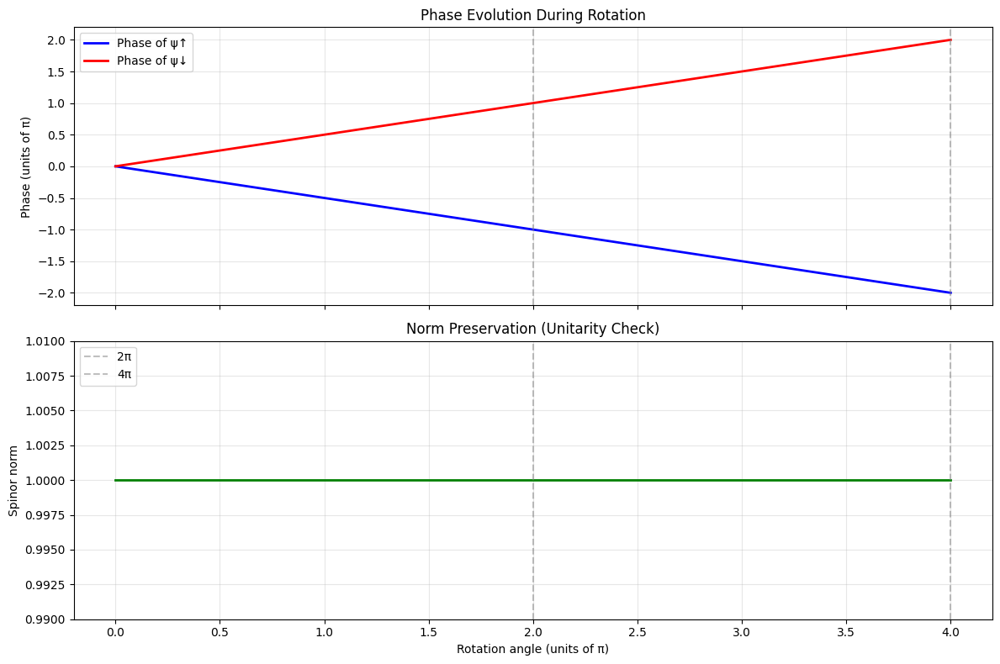


Note: Each component gains π phase after 2π rotation.
This means the spinor picks up a factor of -1 = e^(iπ).


In [7]:
# Track phase evolution
s_initial = Spinor.from_angles(np.pi/4, 0)
axis = np.array([0, 0, 1])

angles = np.linspace(0, 4*np.pi, 200)
phases_up = []
phases_down = []
norms = []

for angle in angles:
    s = s_initial.rotate_axis_angle(axis, angle)
    phases_up.append(np.angle(s.up))
    phases_down.append(np.angle(s.down))
    norms.append(s.norm)

fig, axes = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

# Phase plot
axes[0].plot(angles/np.pi, np.unwrap(phases_up)/np.pi, 'b-', label='Phase of ψ↑', linewidth=2)
axes[0].plot(angles/np.pi, np.unwrap(phases_down)/np.pi, 'r-', label='Phase of ψ↓', linewidth=2)
axes[0].axvline(2, color='gray', linestyle='--', alpha=0.5)
axes[0].axvline(4, color='gray', linestyle='--', alpha=0.5)
axes[0].set_ylabel('Phase (units of π)')
axes[0].set_title('Phase Evolution During Rotation')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Norm plot (should stay constant)
axes[1].plot(angles/np.pi, norms, 'g-', linewidth=2)
axes[1].axvline(2, color='gray', linestyle='--', alpha=0.5, label='2π')
axes[1].axvline(4, color='gray', linestyle='--', alpha=0.5, label='4π')
axes[1].set_xlabel('Rotation angle (units of π)')
axes[1].set_ylabel('Spinor norm')
axes[1].set_title('Norm Preservation (Unitarity Check)')
axes[1].set_ylim([0.99, 1.01])
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\nNote: Each component gains π phase after 2π rotation.")
print("This means the spinor picks up a factor of -1 = e^(iπ).")


## Bloch Vector Trajectory

Visualize the path traced by the Bloch vector during rotation:

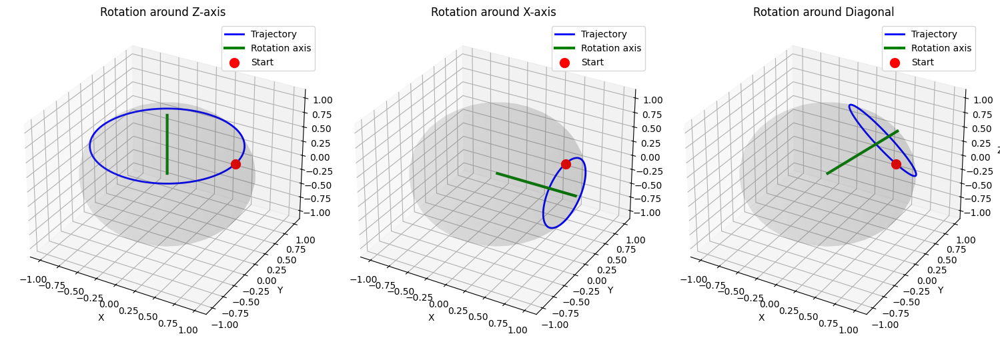

In [8]:
# Plot Bloch vector trajectory
s_initial = Spinor.from_angles(np.pi/3, 0)

axes_to_try = [
    (np.array([0, 0, 1]), 'Z-axis'),
    (np.array([1, 0, 0]), 'X-axis'),
    (np.array([1, 1, 1]), 'Diagonal')
]

fig = plt.figure(figsize=(15, 5))

for i, (axis, name) in enumerate(axes_to_try):
    axis = normalize(axis)
    angles = np.linspace(0, 2*np.pi, 100)

    trajectory = []
    for angle in angles:
        s = s_initial.rotate_axis_angle(axis, angle)
        trajectory.append(s.bloch_vector())
    trajectory = np.array(trajectory)

    ax = fig.add_subplot(1, 3, i+1, projection='3d')

    # Draw unit sphere
    u = np.linspace(0, 2*np.pi, 30)
    v = np.linspace(0, np.pi, 20)
    x = np.outer(np.cos(u), np.sin(v))
    y = np.outer(np.sin(u), np.sin(v))
    z = np.outer(np.ones(np.size(u)), np.cos(v))
    ax.plot_surface(x, y, z, alpha=0.1, color='gray')

    # Draw trajectory
    ax.plot(trajectory[:, 0], trajectory[:, 1], trajectory[:, 2],
            'b-', linewidth=2, label='Trajectory')

    # Draw rotation axis
    ax.plot([0, axis[0]], [0, axis[1]], [0, axis[2]],
            'g-', linewidth=3, label='Rotation axis')

    # Initial point
    ax.scatter(*s_initial.bloch_vector(), color='red', s=100, label='Start')

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title(f'Rotation around {name}')
    ax.legend()

plt.tight_layout()
plt.show()


## Save Animation as Video

You can save the animation as a video file:

In [9]:
# Example: Save animation (uncomment to use)
# s = Spinor.from_angles(np.pi/3, np.pi/4)
# anim = animate_spinor_rotation(s, np.array([0, 0, 1]))
# anim.save('spinor_rotation.mp4', writer='ffmpeg', fps=20)
# anim.save('spinor_rotation.gif', writer='pillow', fps=20)

print("To save animations, uncomment the code above.")
print("Requires ffmpeg for MP4 or pillow for GIF.")


To save animations, uncomment the code above.
Requires ffmpeg for MP4 or pillow for GIF.


## Summary

In this notebook, we've demonstrated:

1. **Spinor animation** under continuous rotation
2. **Side-by-side 2D/3D views** showing the hyperchord evolution
3. **Phase tracking** confirming the 4π periodicity
4. **Bloch vector trajectories** on the sphere

These visualizations help build intuition for the unique geometric properties of spinors that distinguish them from ordinary vectors.